<a href="https://colab.research.google.com/github/Raanank10/Instagram-s-influencers/blob/main/Image_Labels_Contribution_Explaiened_by_SHAP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# inport and install Package

In [190]:
!pip install dataprep

Import Packages:

In [191]:
# General Tools
import numpy as np
import scipy as sp
import pandas as pd
import missingno as msno
import xgboost as xgb
import datetime

# SK Learn
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn import neighbors
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MaxAbsScaler, MinMaxScaler, StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import accuracy_score , confusion_matrix, roc_auc_score, roc_curve
from sklearn.metrics import log_loss
from sklearn.metrics import classification_report # elad 20210708
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_selection import SelectKBest, chi2, f_classif, mutual_info_classif
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit

from sklearn.preprocessing import OrdinalEncoder # elad 20210911

# Trees Visualization
import pydot
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO

# For scoring
from sklearn.metrics import mean_squared_log_error as msle
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score

# Misc
import warnings
from sys import modules
from time import time
from platform import python_version

# Visualization
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go

# IPython
from IPython.display import Image, display

# Confuguration
warnings.filterwarnings('ignore')
%matplotlib inline

# EDA prep
from dataprep.eda import plot, plot_correlation, plot_missing, create_report


# Get the Data:

In [192]:
path_part0 = 'https://raw.githubusercontent.com/Raanank10/Instagram-s-influencers/main/ai_posts_analysis_data.xlsx'
path_part1= 'https://raw.githubusercontent.com/Raanank10/Instagram-s-influencers/main/project_part1.csv'
path_part2= 'https://raw.githubusercontent.com/Raanank10/Instagram-s-influencers/main/project_part2.csv'

train_size = 0.75
rand_state = 990
sigma = 3
Min_followers = 500

# Bining
bin_labels=['Low','Medium','High', 'Very High','Extreme']

# Concate the 3 files into 1 Datafarme file:

In [193]:
df_part0 = pd.read_csv(path_part0, index_col=0)  
df_part1 = pd.read_csv(path_part1, index_col=0) 
df_part2 = pd.read_csv(path_part2, index_col=0) 
df = pd.concat([df_part0, df_part1, df_part2])

In [194]:
df.columns = df.columns.str.replace(' ', '_')

In [195]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40849 entries, 1918 to 37857
Data columns (total 26 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   USERID                          40849 non-null  int64  
 1   USERNAME                        40849 non-null  object 
 2   FULLNAME                        39489 non-null  object 
 3   FOLLOWER                        40849 non-null  int64  
 4   POST_ID                         40849 non-null  float64
 5   SHORTCODE                       40849 non-null  object 
 6   LIKES                           40849 non-null  int64  
 7   COMMENTS                        40849 non-null  int64  
 8   ENGAGEMENT                      40849 non-null  float64
 9   URL                             40849 non-null  object 
 10  ACCESSIBILITY_CAPTION           33725 non-null  object 
 11  CAPTION                         34786 non-null  object 
 12  LOCATION                     

Remove row without Image Labels:

In [196]:
print(f'data len Before = {len(df)}')
df = df[df['IMAGE_LABELS'].notna()]
print(f'data len After  = {len(df)}')

data len Before = 40849
data len After  = 40808


In [197]:
#print(f'data len Before = {len(df)}')
len(df[df['FOLLOWER'].notna()])
#print(f'data len After  = {len(df)}')

40808

# Clean the data:

In [198]:
df = df[~df.index.duplicated()]

In [199]:

df = df[df.FOLLOWER >= Min_followers] # 500

# Presenting the Data

In [200]:
df.head(2)

,USERID,USERNAME,FULLNAME,FOLLOWER,POST_ID,SHORTCODE,LIKES,COMMENTS,ENGAGEMENT,URL,ACCESSIBILITY_CAPTION,CAPTION,LOCATION,CITY,COUNTRY,TIME,IMAGE_LABELS,CAPTION_INTEREST,ACCESSIBILITY_CAPTION_INTEREST,IMAGE_LABEL_INTEREST,IMAGE_URL,COMMENT_DISABLED,IS_VIDEO,HAS_AUDIO,VIDEO_URL,VIDEO_VIEW_COUNT
1,,,,,,,,,,,,,,,,,,,,,,,,,,
1918,36193140327,elastici_e_passamaneria,Elastici e Passamaneria,1052,2.530601e+18,CMegChUlwm2,23,0,2.19,https://www.instagram.com/p/CMegChUlwm2,"Photo by Elastici e Passamaneria on March 16, ...",FFP2 MADE IN ITALY????????#ffp2mask#italiansty...,NaN,NaN,NaN,1615891163,"Clothing, Apparel, Text, Money, Collage, Adver...",education,movies,business,https://instagram.fdok2-1.fna.fbcdn.net/v/t51....,no,no,no,NaN,NaN
1920,36838177086,ilaria._004,????????????????,649,2.356209e+18,CCy784yAY26,138,2,21.57,https://www.instagram.com/p/CCy784yAY26,"Photo by ???????????????? on July 18, 2020. Ma...",mirame????,NaN,NaN,NaN,1595102049,"Clothing, Apparel, Person, Human, Female, Swim...",education,arts_entertainment,style_fashion,https://instagram.fgua5-1.fna.fbcdn.net/v/t51....,no,no,no,NaN,NaN


In [201]:
df.describe()

,USERID,FOLLOWER,POST_ID,LIKES,COMMENTS,ENGAGEMENT,TIME,VIDEO_VIEW_COUNT
count,2.210900e+04,2.210900e+04,2.210900e+04,2.210900e+04,22109.000000,22109.000000,2.210900e+04,4.088000e+03
mean,1.294132e+10,5.356385e+04,2.560918e+18,1.012655e+03,29.703876,5.446324,1.619499e+09,1.450723e+04
std,1.635062e+10,1.011601e+06,1.702874e+17,2.268217e+04,706.638620,7.578862,2.029325e+07,2.317900e+05
min,3.142160e+05,5.000000e+02,6.216878e+17,0.000000e+00,0.000000,0.000000,1.388331e+09,0.000000e+00
25%,5.638796e+08,9.180000e+02,2.560000e+18,2.300000e+01,0.000000,1.270000,1.619571e+09,9.400000e+01
50%,4.447307e+09,1.616000e+03,2.610000e+18,5.700000e+01,3.000000,3.140000,1.624838e+09,2.355000e+02
75%,2.290415e+10,4.140000e+03,2.650000e+18,1.360000e+02,10.000000,6.960000,1.630711e+09,7.300000e+02
max,4.944817e+10,3.636130e+07,2.670000e+18,1.409732e+06,73188.000000,338.740000,1.632341e+09,9.785071e+06



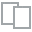
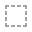
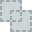
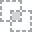
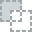
...
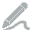
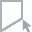
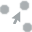
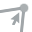
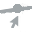

In [202]:
plot_missing(df)


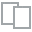
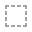
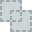
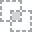
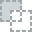
...
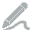
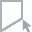
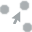
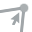
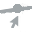

In [203]:
plot(df, "LIKES")


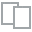
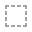
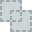
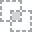
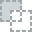
...
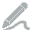
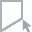
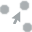
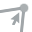
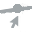

In [204]:
plot(df, "FOLLOWER")


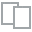
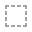
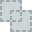
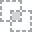
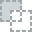
...
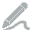
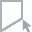
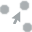
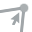
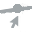

In [205]:
plot(df, "IMAGE_LABELS")

In [206]:
print(f'data len Before = {len(df)}')
df = df[df['ENGAGEMENT'].notna()]
print(f'data len After  = {len(df)}')

data len Before = 22109
data len After  = 22109



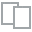
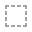
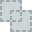
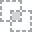
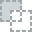
...
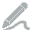
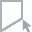
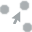
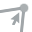
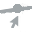

In [207]:
plot(df, "IMAGE_LABEL_INTEREST")

# Prepare the y values

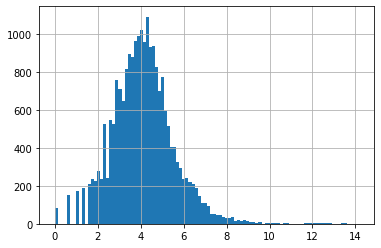

In [208]:
df['log_LIKES']  = np.log1p(df.LIKES)
#df.LIKES.hist(bins=100)
df.log_LIKES.hist(bins=100)

In [209]:
df['LIKES_PER_FOLLOWER'] = df['log_LIKES'] / df['FOLLOWER']
df['log_LIKES_PER_FOLLOWER'] = np.log1p(df.LIKES_PER_FOLLOWER)


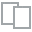
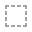
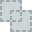
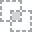
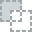
...
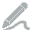
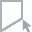
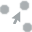
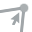
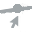

In [210]:
plot(df, "LIKES_PER_FOLLOWER")

# split Image Labels to dummy columns:

In [211]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22109 entries, 1918 to 37546
Data columns (total 29 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   USERID                          22109 non-null  int64  
 1   USERNAME                        22109 non-null  object 
 2   FULLNAME                        21584 non-null  object 
 3   FOLLOWER                        22109 non-null  int64  
 4   POST_ID                         22109 non-null  float64
 5   SHORTCODE                       22109 non-null  object 
 6   LIKES                           22109 non-null  int64  
 7   COMMENTS                        22109 non-null  int64  
 8   ENGAGEMENT                      22109 non-null  float64
 9   URL                             22109 non-null  object 
 10  ACCESSIBILITY_CAPTION           17747 non-null  object 
 11  CAPTION                         20136 non-null  object 
 12  LOCATION                     

In [212]:
df_image_labels_dummies = df['IMAGE_LABELS'].str.get_dummies(sep=',')

In [213]:
df_image_labels_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22109 entries, 1918 to 37546
Columns: 3050 entries,  Abies to Zoo
dtypes: int64(3050)
memory usage: 514.6 MB


In [214]:
df_image_labels_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22109 entries, 1918 to 37546
Columns: 3050 entries,  Abies to Zoo
dtypes: int64(3050)
memory usage: 514.6 MB


In [215]:
df_image_labels_dummies.describe()

,Abies,Absinthe,Abyssinian,Acanthaceae,Accessories,Accessory,Accipiter,Accordion,Acorn,Acrobatic,Adapter,Adventure,Advertisement,Aerial View,Affenpinscher,Aftershave,Agapanthus,Agaric,Agate,Agavaceae,Agelaius,Agriculture,Agropyron,Air Conditioner,Aircraft,Airedale,Airfield,Airliner,Airplane,Airport,Airport Terminal,Aisle,Alcohol,Algae,Alien,Alley,Alleyway,Alloy Wheel,Almond,Aloe,...,Wand,Wasp,Water,Watercraft,Waterfront,Weapon,Weather,Weaving,Wedding Cake,Wedding Gown,Weed,Whale,Wheel,White,White Board,Wilderness,Wildlife,Window,Window Display,Windshield,Wine,Wiring,Wolf,Wood,Wool,Word,Worker,Working Out,Workshop,Worship,Woven,Wreath,Wristwatch,X-Ray,Yard,Yarn,Yogurt,Zebra,Zipper,Zoo
count,22109.00000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,...,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000,22109.000000
mean,0.00778,0.000045,0.001131,0.000543,0.124519,0.128862,0.000090,0.000045,0.000090,0.001402,0.000362,0.008413,0.108146,0.001945,0.000633,0.000362,0.000045,0.000362,0.000181,0.000452,0.000090,0.000859,0.000090,0.000226,0.002352,0.000045,0.000633,0.000271,0.001583,0.001040,0.000136,0.000226,0.016193,0.000090,0.000317,0.001945,0.001945,0.006604,0.000136,0.000362,...,0.000045,0.000136,0.006649,0.000543,0.000090,0.000271,0.000136,0.000045,0.000226,0.000181,0.000045,0.000045,0.001538,0.000226,0.000317,0.000407,0.000181,0.000271,0.000045,0.000090,0.000045,0.000045,0.000045,0.005156,0.000136,0.002397,0.000045,0.000090,0.000181,0.000362,0.000045,0.000045,0.001900,0.000045,0.000814,0.000226,0.000045,0.000090,0.000045,0.000090
std,0.08786,0.006725,0.033609,0.023292,0.330181,0.335054,0.009511,0.006725,0.009511,0.037420,0.019019,0.091337,0.310572,0.044059,0.025157,0.019019,0.006725,0.019019,0.013450,0.021263,0.009511,0.029303,0.009511,0.015037,0.048441,0.006725,0.025157,0.016472,0.039757,0.032238,0.011648,0.015037,0.126218,0.009511,0.017791,0.044059,0.044059,0.080996,0.011648,0.019019,...,0.006725,0.011648,0.081271,0.023292,0.009511,0.016472,0.011648,0.006725,0.015037,0.013450,0.006725,0.006725,0.039186,0.015037,0.017791,0.020172,0.013450,0.016472,0.006725,0.009511,0.006725,0.006725,0.006725,0.071623,0.011648,0.048904,0.006725,0.009511,0.013450,0.019019,0.006725,0.006725,0.043545,0.006725,0.028522,0.015037,0.006725,0.009511,0.006725,0.009511
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

In [216]:
s = (df_image_labels_dummies.apply(lambda col: col.sum()).sort_values(ascending=False))

In [217]:
s

 Human         15050
 Apparel       10301
 Person         9984
 Clothing       6860
 Female         6859
               ...  
 Grille            1
 Grenade           1
 Chain Mail        1
 Gravy             1
 Missile           1
Length: 3050, dtype: int64

In [218]:
df_all_labels = pd.DataFrame({'LABEL':s.index, 'LABEL_COUNT':s.values})

In [219]:
df_all_labels

,LABEL,LABEL_COUNT
0,Human,15050
1,Apparel,10301
2,Person,9984
3,Clothing,6860
4,Female,6859
...,...,...
3045,Grille,1
3046,Grenade,1
3047,Chain Mail,1
3048,Gravy,1



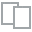
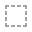
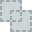
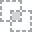
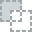
...
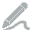
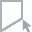
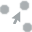
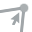
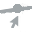

In [220]:
plot(df_all_labels, "LABEL")

In [234]:
df_all_labels[df_all_labels['LABEL'].str.contains('room')]

,LABEL,LABEL_COUNT
285,Bridegroom,181
306,Bedroom,160
618,Bathroom,47
766,Classroom,32
1161,Bedroom,13
1468,Mushroom,8
2309,Ballroom,2
2847,Classroom,1


In [232]:
df_all_labels[df_all_labels['LABEL'] == 'computer'] #.str.contains('computer')]

,LABEL,LABEL_COUNT


In [222]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22109 entries, 1918 to 37546
Data columns (total 29 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   USERID                          22109 non-null  int64  
 1   USERNAME                        22109 non-null  object 
 2   FULLNAME                        21584 non-null  object 
 3   FOLLOWER                        22109 non-null  int64  
 4   POST_ID                         22109 non-null  float64
 5   SHORTCODE                       22109 non-null  object 
 6   LIKES                           22109 non-null  int64  
 7   COMMENTS                        22109 non-null  int64  
 8   ENGAGEMENT                      22109 non-null  float64
 9   URL                             22109 non-null  object 
 10  ACCESSIBILITY_CAPTION           17747 non-null  object 
 11  CAPTION                         20136 non-null  object 
 12  LOCATION                     

In [223]:
df_with_dummies = pd.concat([df, df_image_labels_dummies])

In [224]:
df_with_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44218 entries, 1918 to 37546
Columns: 3079 entries, USERID to Zoo
dtypes: float64(3061), object(18)
memory usage: 1.0+ GB


Sampling random data:

# Split X, y

Remove columns the will cause y leak into X